Import packages

In [ ]:
import urllib.request
import PyPDF2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer

# Data Collection & Cleaning

Create list of Federal Reserve meeting dates

In [2]:
meeting_dates = ['04/29/2020', '03/15/2020', '01/29/2020', 
                 '12/11/2019', '10/30/2019', '09/18/2019', '07/31/2019', '06/19/2019', '05/01/2019', '03/20/2019', '01/30/2019',
                 '12/19/2018', '11/08/2018', '09/26/2018', '08/01/2018', '06/13/2018', '05/02/2018', '03/21/2018', '01/31/2018',
                 '12/13/2017', '11/01/2017', '09/20/2017', '07/26/2017', '06/14/2017', '05/03/2017', '03/15/2017', '02/01/2017',
                 '12/14/2016', '11/02/2016', '09/21/2016', '07/27/2016', '06/15/2016', '04/27/2016', '03/16/2016', '01/27/2016',
                 '12/16/2015', '10/28/2015', '09/17/2015', '07/29/2015', '06/17/2015', '04/29/2015', '03/18/2015', '01/28/2015',
                 '12/17/2014', '10/29/2014', '09/17/2014', '07/30/2014', '06/18/2014', '04/30/2014', '03/19/2014', '01/29/2014',
                 '12/18/2013', '10/30/2013', '09/18/2013', '07/31/2013', '06/19/2013', '05/01/2013', '03/20/2013', '01/30/2013',
                 '12/12/2012', '10/24/2012', '09/13/2012', '08/01/2012', '06/20/2012', '04/25/2012', '03/13/2012', '01/25/2012',
                 '12/13/2011', '11/02/2011', '09/21/2011', '08/09/2011', '06/22/2011', '04/27/2011', '03/15/2011', '01/26/2011',
                 '12/14/2010', '11/03/2010', '09/21/2010', '08/10/2010', '06/23/2010', '04/28/2010', '03/16/2010', '01/27/2010',
                 '12/16/2009', '11/04/2009', '09/23/2009', '08/12/2009', '06/24/2009', '04/29/2009', '03/18/2009', '01/28/2009',
                 '12/16/2008', '10/29/2008', '09/16/2008', '08/05/2008', '06/25/2008', '04/30/2008', '03/18/2008', '01/30/2008',
                 '12/11/2007', '10/31/2007', '09/18/2007', '08/07/2007', '06/28/2007', '05/09/2007', '03/21/2007', '01/31/2007',
                 '12/12/2006', '10/25/2006', '09/20/2006', '08/08/2006', '06/29/2006', '05/10/2006', '03/28/2006', '01/31/2006',
                 '12/13/2005', '11/01/2005', '09/20/2005', '08/09/2005', '06/30/2005', '05/03/2005', '03/22/2005', '02/02/2005',
                 '12/14/2004', '11/10/2004', '09/21/2004', '08/10/2004', '06/30/2004', '05/04/2004', '03/16/2004', '01/28/2004']

Split Federal Reservemeeting dates list based on url style

In [3]:
meeting_dates_1 = meeting_dates[:101]
meeting_dates_2 = meeting_dates[101:]
meeting_dates_1

['04/29/2020',
 '03/15/2020',
 '01/29/2020',
 '12/11/2019',
 '10/30/2019',
 '09/18/2019',
 '07/31/2019',
 '06/19/2019',
 '05/01/2019',
 '03/20/2019',
 '01/30/2019',
 '12/19/2018',
 '11/08/2018',
 '09/26/2018',
 '08/01/2018',
 '06/13/2018',
 '05/02/2018',
 '03/21/2018',
 '01/31/2018',
 '12/13/2017',
 '11/01/2017',
 '09/20/2017',
 '07/26/2017',
 '06/14/2017',
 '05/03/2017',
 '03/15/2017',
 '02/01/2017',
 '12/14/2016',
 '11/02/2016',
 '09/21/2016',
 '07/27/2016',
 '06/15/2016',
 '04/27/2016',
 '03/16/2016',
 '01/27/2016',
 '12/16/2015',
 '10/28/2015',
 '09/17/2015',
 '07/29/2015',
 '06/17/2015',
 '04/29/2015',
 '03/18/2015',
 '01/28/2015',
 '12/17/2014',
 '10/29/2014',
 '09/17/2014',
 '07/30/2014',
 '06/18/2014',
 '04/30/2014',
 '03/19/2014',
 '01/29/2014',
 '12/18/2013',
 '10/30/2013',
 '09/18/2013',
 '07/31/2013',
 '06/19/2013',
 '05/01/2013',
 '03/20/2013',
 '01/30/2013',
 '12/12/2012',
 '10/24/2012',
 '09/13/2012',
 '08/01/2012',
 '06/20/2012',
 '04/25/2012',
 '03/13/2012',
 '01/25/20

Create list of urls for downloading Fed Minutes

In [4]:
urls = []
for date in meeting_dates_1:
    split_date = date.split('/')
    url = 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes{}{}{}.pdf'.format(split_date[2]
                    ,split_date[0], split_date[1])
    urls.append(url)
for date in meeting_dates_2:
    split_date = date.split('/')
    url = 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/{}{}{}min.pdf'.format(split_date[2]
                    ,split_date[0], split_date[1])
    urls.append(url)
urls = ['https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20121023.pdf' if x == 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20121024.pdf' else x for x in urls]
urls

['https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20200429.pdf',
 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20200315.pdf',
 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20200129.pdf',
 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20191211.pdf',
 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20191030.pdf',
 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20190918.pdf',
 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20190731.pdf',
 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20190619.pdf',
 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20190501.pdf',
 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcmi

Retrieve Fed Minutes PDF from URL

In [5]:
for date,url in zip(meeting_dates,urls):
    form_date = date.replace('/','-')
    urllib.request.urlretrieve(url, "{}.pdf".format(form_date))
    print(date)

04/29/2020
03/15/2020
01/29/2020
12/11/2019
10/30/2019
09/18/2019
07/31/2019
06/19/2019
05/01/2019
03/20/2019
01/30/2019
12/19/2018
11/08/2018
09/26/2018
08/01/2018
06/13/2018
05/02/2018
03/21/2018
01/31/2018
12/13/2017
11/01/2017
09/20/2017
07/26/2017
06/14/2017
05/03/2017
03/15/2017
02/01/2017
12/14/2016
11/02/2016
09/21/2016
07/27/2016
06/15/2016
04/27/2016
03/16/2016
01/27/2016
12/16/2015
10/28/2015
09/17/2015
07/29/2015
06/17/2015
04/29/2015
03/18/2015
01/28/2015
12/17/2014
10/29/2014
09/17/2014
07/30/2014
06/18/2014
04/30/2014
03/19/2014
01/29/2014
12/18/2013
10/30/2013
09/18/2013
07/31/2013
06/19/2013
05/01/2013
03/20/2013
01/30/2013
12/12/2012
10/24/2012
09/13/2012
08/01/2012
06/20/2012
04/25/2012
03/13/2012
01/25/2012
12/13/2011
11/02/2011
09/21/2011
08/09/2011
06/22/2011
04/27/2011
03/15/2011
01/26/2011
12/14/2010
11/03/2010
09/21/2010
08/10/2010
06/23/2010
04/28/2010
03/16/2010
01/27/2010
12/16/2009
11/04/2009
09/23/2009
08/12/2009
06/24/2009
04/29/2009
03/18/2009
01/28/2009

Load Fed Minutes PDF text/associated Fed Meeting dates into minutes_df dataframe

In [6]:
columns = ['Date', 'Minutes']
data = []
for date in meeting_dates:
    pdf_file = open('{}.pdf'.format(date.replace('/','-')), 'rb')
    pdf_reader = PyPDF2.PdfFileReader(pdf_file)
    text = ''
    for num in range(0,pdf_reader.numPages):
        page_obj = pdf_reader.getPage(num).extractText().replace('\n','').lower()
        text = text + page_obj
    data.append([date,text])
    print(date)
minutes_df = pd.DataFrame(data, columns=columns)
    
    

04/29/2020
03/15/2020
01/29/2020
12/11/2019
10/30/2019
09/18/2019
07/31/2019
06/19/2019
05/01/2019
03/20/2019
01/30/2019
12/19/2018
11/08/2018
09/26/2018
08/01/2018
06/13/2018
05/02/2018
03/21/2018
01/31/2018
12/13/2017
11/01/2017
09/20/2017
07/26/2017
06/14/2017
05/03/2017
03/15/2017
02/01/2017
12/14/2016
11/02/2016
09/21/2016
07/27/2016
06/15/2016
04/27/2016
03/16/2016
01/27/2016
12/16/2015
10/28/2015
09/17/2015
07/29/2015
06/17/2015
04/29/2015
03/18/2015
01/28/2015
12/17/2014
10/29/2014
09/17/2014
07/30/2014
06/18/2014
04/30/2014
03/19/2014
01/29/2014
12/18/2013
10/30/2013
09/18/2013
07/31/2013
06/19/2013
05/01/2013
03/20/2013
01/30/2013
12/12/2012
10/24/2012
09/13/2012
08/01/2012
06/20/2012
04/25/2012
03/13/2012
01/25/2012
12/13/2011
11/02/2011
09/21/2011
08/09/2011
06/22/2011
04/27/2011
03/15/2011
01/26/2011
12/14/2010
11/03/2010
09/21/2010
08/10/2010
06/23/2010
04/28/2010
03/16/2010
01/27/2010
12/16/2009
11/04/2009
09/23/2009
08/12/2009
06/24/2009
04/29/2009
03/18/2009
01/28/2009

Convert Fed Meeting 'Date' column in minutes_df into datetime stamp and calculate associated Minutes 'Release Date'
21 days following meeting date and 'End Date' of 28 day period following Minutes release date

In [7]:
import datetime
minutes_df['Date'] = pd.to_datetime(minutes_df['Date'])
minutes_df['Release Date'] = minutes_df['Date'] + pd.DateOffset(21)
minutes_df['End Date'] = minutes_df['Release Date'] + pd.DateOffset(28)
minutes_df.drop(0, axis=0, inplace=True)
minutes_df.head()

,Date,Minutes,Release Date,End Date
1,2020-03-15,minutes of the federal open market committee...,2020-04-05,2020-05-03
2,2020-01-29,minutes of the federal open market committee j...,2020-02-19,2020-03-18
3,2019-12-11,minutes of the federal open market committee...,2020-01-01,2020-01-29
4,2019-10-30,minutes of the federal open market committee o...,2019-11-20,2019-12-18
5,2019-09-18,minutes of the federal open market committee s...,2019-10-09,2019-11-06


Read Excel file of historical S&P 500 prices into stock_price df

In [9]:
stock_prices = pd.read_csv('sandp500.csv')
stock_prices['Date'] = pd.to_datetime(stock_prices['Date'])
stock_prices.head(5)

,Date,Open,High,Low,Close
0,2020-06-15,2993.76,3079.76,2965.66,3066.59
1,2020-06-12,3071.04,3088.42,2984.47,3041.31
2,2020-06-11,3123.53,3123.53,2999.49,3002.10
3,2020-06-10,3213.42,3223.27,3181.49,3190.14
4,2020-06-09,3213.32,3222.71,3193.11,3207.18


Calculate post-Fed Minutes release S&P 500 return associated with each Federal Reserve meeting

In [10]:
dates =  minutes_df['Release Date'].values
return_values = []
for date in dates:
    if date in stock_prices['Date'].values:
        pass
    elif date + np.timedelta64(1,'D') in stock_prices['Date'].values:
        date = date + np.timedelta64(1,'D')
    elif date + np.timedelta64(2,'D') in stock_prices['Date'].values:
        date = date + np.timedelta64(2,'D')
    elif date + np.timedelta64(3,'D') in stock_prices['Date'].values:
        date = date + np.timedelta64(3,'D')
    start_price = stock_prices[stock_prices['Date'] == date][' Open'].values
    if date + np.timedelta64(21,'D') in stock_prices['Date'].values:
        end_date = date + np.timedelta64(21,'D')
    elif date + np.timedelta64(22,'D') in stock_prices['Date'].values:
        end_date = date + np.timedelta64(22,'D')
    elif date + np.timedelta64(23,'D') in stock_prices['Date'].values:
        end_date = date + np.timedelta64(23,'D')
    elif date + np.timedelta64(24,'D') in stock_prices['Date'].values:
        end_date = date + np.timedelta64(24,'D')
    end_price = stock_prices[stock_prices['Date'] == end_date][' Close'].values
    return_value = (end_price-start_price)/start_price
    return_values.append(return_value[0])

Create column in minutes_df with return associated with each Fed Meeting

In [11]:
minutes_df['Return'] = return_values
minutes_df.head(5)

,Date,Minutes,Release Date,End Date,Return
1,2020-03-15,minutes of the federal open market committee...,2020-04-05,2020-05-03,0.116434
2,2020-01-29,minutes of the federal open market committee j...,2020-02-19,2020-03-18,-0.189034
3,2019-12-11,minutes of the federal open market committee...,2020-01-01,2020-01-29,0.024924
4,2019-10-30,minutes of the federal open market committee o...,2019-11-20,2019-12-18,0.008659
5,2019-09-18,minutes of the federal open market committee s...,2019-10-09,2019-11-06,0.046604


# EDA

Tokenize Fed Minutes Text

In [12]:
from nltk.tokenize import RegexpTokenizer
tokenizer = RegexpTokenizer(r'[a-zA-Z0-9]+')
tokenized_review = []
for doc in minutes_df['Minutes']:
    token = tokenizer.tokenize(doc)
    tokenized_review.append(token)

Create column in minutes_df with tokenized Fed Minutes text

In [13]:
minutes_df['Tokenized Minutes'] = tokenized_review
minutes_df.head()

,Date,Minutes,Release Date,End Date,Return,Tokenized Minutes
1,2020-03-15,minutes of the federal open market committee...,2020-04-05,2020-05-03,0.116434,"[minutes, of, the, federal, open, market, comm..."
2,2020-01-29,minutes of the federal open market committee j...,2020-02-19,2020-03-18,-0.189034,"[minutes, of, the, federal, open, market, comm..."
3,2019-12-11,minutes of the federal open market committee...,2020-01-01,2020-01-29,0.024924,"[minutes, of, the, federal, open, market, comm..."
4,2019-10-30,minutes of the federal open market committee o...,2019-11-20,2019-12-18,0.008659,"[minutes, of, the, federal, open, market, comm..."
5,2019-09-18,minutes of the federal open market committee s...,2019-10-09,2019-11-06,0.046604,"[minutes, of, the, federal, open, market, comm..."


Create return_cat function to categorize if the return in a row of minutes_df is positive, negative or flat

In [14]:
def return_cat(row):
    if row['Return'] >= .01:
        return 'Positive'
    elif row['Return'] <= -.01:
        return 'Negative'
    elif -.01 < row['Return'] < .01:
        return 'Flat'

Apply return_cat function to minutes_df in order to create a column specifying return category of each row

In [15]:
minutes_df['Category'] = minutes_df.apply(return_cat, axis=1)
minutes_df

,Date,Minutes,Release Date,End Date,Return,Tokenized Minutes,Category
1,2020-03-15,minutes of the federal open market committee...,2020-04-05,2020-05-03,0.116434,"[minutes, of, the, federal, open, market, comm...",Positive
2,2020-01-29,minutes of the federal open market committee j...,2020-02-19,2020-03-18,-0.189034,"[minutes, of, the, federal, open, market, comm...",Negative
3,2019-12-11,minutes of the federal open market committee...,2020-01-01,2020-01-29,0.024924,"[minutes, of, the, federal, open, market, comm...",Positive
4,2019-10-30,minutes of the federal open market committee o...,2019-11-20,2019-12-18,0.008659,"[minutes, of, the, federal, open, market, comm...",Flat
5,2019-09-18,minutes of the federal open market committee s...,2019-10-09,2019-11-06,0.046604,"[minutes, of, the, federal, open, market, comm...",Positive
...,...,...,...,...,...,...,...
126,2004-08-10,"august 10, 2004a meeting of the federal open m...",2004-08-31,2004-09-28,0.022694,"[august, 10, 2004a, meeting, of, the, federal,...",Positive
127,2004-06-30,"june 29-30, 2004a meeting of the federal open ...",2004-07-21,2004-08-18,-0.016537,"[june, 29, 30, 2004a, meeting, of, the, federa...",Negative
128,2004-05-04,"may 4, 2004a meeting of the federal open marke...",2004-05-25,2004-06-22,0.017034,"[may, 4, 2004a, meeting, of, the, federal, ope...",Positive
129,2004-03-16,"march 16, 2004a meeting of the federal open ma...",2004-04-06,2004-05-04,-0.008753,"[march, 16, 2004a, meeting, of, the, federal, ...",Flat


Remove stopwords from tokenized Fed Minutes and create a Frequency Distribution of words in all Fed Minutes

In [16]:
from nltk.probability import FreqDist
from nltk.corpus import stopwords
tokenized_review_list = []
for minute in minutes_df['Tokenized Minutes']:
        tokenized_review_list.extend(minute)
stop_words=set(stopwords.words("english"))
filtered_tokens = []
for w in tokenized_review_list:
    if w not in stop_words:
        filtered_tokens.append(w)
fdist = FreqDist(filtered_tokens)
print(fdist)

<FreqDist with 16565 samples and 773799 outcomes>


Plot Fed Minutes Words Frequency Distribution

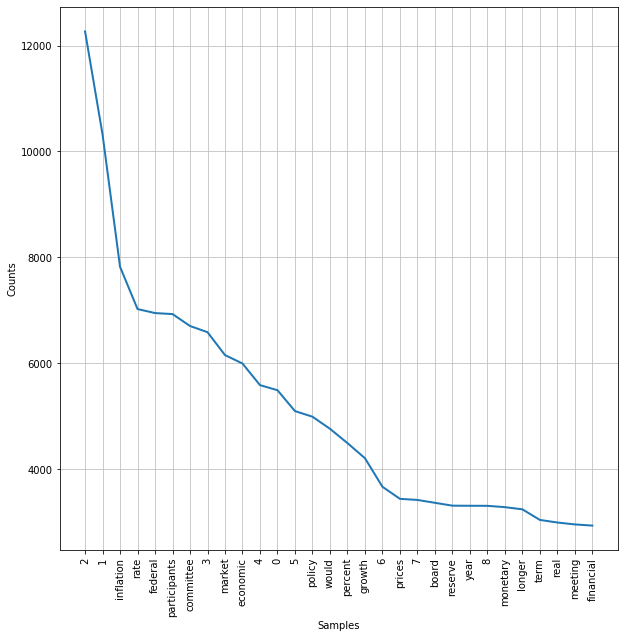

In [17]:
plt.figure(figsize=(10,10))
fdist.plot(30)

Remove adittional stop words from tokenized fed minutes

In [20]:
stop_words_updated = list(stop_words) + ['percent','quarter','policy','economic','would','prices','board','reserve','year','monetary','real','inflation','rate','federal','market','committee','the','participants','board','1','2','3','4','5','6','7','8','9','0','financial']
final_tokens=[]
for w in tokenized_review_list:
    if w not in stop_words_updated:
        final_tokens.append(w)
fdist_final = FreqDist(final_tokens)
print(fdist_final)

<FreqDist with 16537 samples and 627817 outcomes>


Graph Frequency Distribution of tokenized Fed Minutes with adittional stop words removed

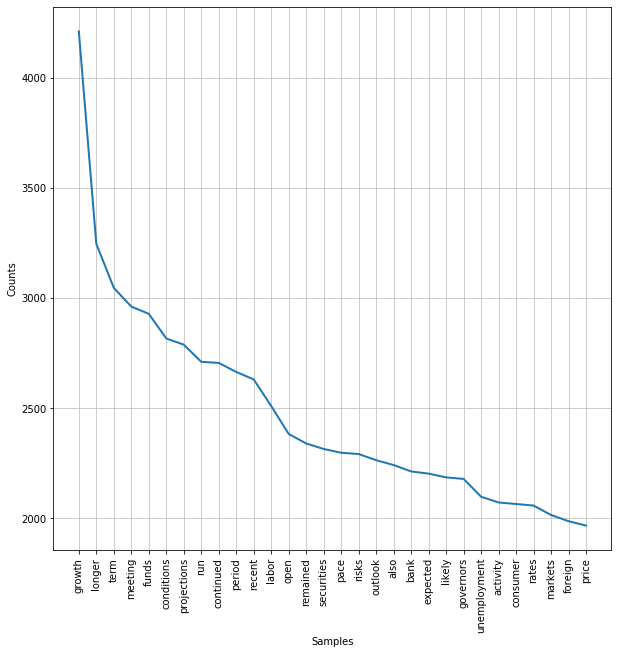

In [21]:
plt.figure(figsize=(10,10))
fdist_final.plot(30)

# Data Processing

Create X and Y variables from Minutes_df

In [22]:
X = minutes_df['Tokenized Minutes']
y = minutes_df['Category']
print(X)
print(y)

1      [minutes, of, the, federal, open, market, comm...
2      [minutes, of, the, federal, open, market, comm...
3      [minutes, of, the, federal, open, market, comm...
4      [minutes, of, the, federal, open, market, comm...
5      [minutes, of, the, federal, open, market, comm...
                             ...                        
126    [august, 10, 2004a, meeting, of, the, federal,...
127    [june, 29, 30, 2004a, meeting, of, the, federa...
128    [may, 4, 2004a, meeting, of, the, federal, ope...
129    [march, 16, 2004a, meeting, of, the, federal, ...
130    [january, 27, 28, 2004a, meeting, of, the, fed...
Name: Tokenized Minutes, Length: 130, dtype: object
1      Positive
2      Negative
3      Positive
4          Flat
5      Positive
         ...   
126    Positive
127    Negative
128    Positive
129        Flat
130    Negative
Name: Category, Length: 130, dtype: object


Remove Stop Words from Tokenized Fed Minutes

In [23]:
filtered_X = []
for minute in X:
    filtered_minute=[]
    for w in minute:
        if w not in stop_words_updated:
            filtered_minute.append(w)
    filtered_X.append(filtered_minute)
filtered_X

[['minutes',
  'open',
  'march',
  '15',
  '2020',
  'joint',
  'meeting',
  'open',
  'governors',
  'held',
  'videoconfer',
  'ence',
  'sunday',
  'march',
  '15',
  '2020',
  '10',
  '00',
  'present',
  'jerome',
  'h',
  'powell',
  'chair',
  'john',
  'c',
  'williams',
  'vice',
  'chair',
  'michelle',
  'w',
  'bowman',
  'lael',
  'brainard',
  'richard',
  'h',
  'clarida',
  'patrick',
  'harker',
  'robert',
  'kaplan',
  'neel',
  'kashkari',
  'loretta',
  'j',
  'mester',
  'randal',
  'k',
  'quarles',
  'thomas',
  'barkin',
  'raphael',
  'w',
  'bostic',
  'mary',
  'c',
  'daly',
  'charles',
  'l',
  'evans',
  'alternate',
  'members',
  'open',
  'james',
  'bullard',
  'esther',
  'l',
  'george',
  'eric',
  'rosengren',
  'presidents',
  'banks',
  'st',
  'louis',
  'kansas',
  'city',
  'boston',
  'respectively',
  'james',
  'clouse',
  'secretary',
  'matthew',
  'luecke',
  'deputy',
  'secretary',
  'michelle',
  'smith',
  'assistant',
  'secretar

Lemmatize Tokenized Fed Minutes

In [24]:
from nltk.stem import WordNetLemmatizer 
lemmatizer = WordNetLemmatizer()
lemmatized_X=[]
for minute in filtered_X:
    lemmatized_minute=[]
    for w in minute:
        lemmatized_minute.append(lemmatizer.lemmatize(w))
    lemmatized_X.append(lemmatized_minute)
lemmatized_X

[['minute',
  'open',
  'march',
  '15',
  '2020',
  'joint',
  'meeting',
  'open',
  'governor',
  'held',
  'videoconfer',
  'ence',
  'sunday',
  'march',
  '15',
  '2020',
  '10',
  '00',
  'present',
  'jerome',
  'h',
  'powell',
  'chair',
  'john',
  'c',
  'williams',
  'vice',
  'chair',
  'michelle',
  'w',
  'bowman',
  'lael',
  'brainard',
  'richard',
  'h',
  'clarida',
  'patrick',
  'harker',
  'robert',
  'kaplan',
  'neel',
  'kashkari',
  'loretta',
  'j',
  'mester',
  'randal',
  'k',
  'quarles',
  'thomas',
  'barkin',
  'raphael',
  'w',
  'bostic',
  'mary',
  'c',
  'daly',
  'charles',
  'l',
  'evans',
  'alternate',
  'member',
  'open',
  'james',
  'bullard',
  'esther',
  'l',
  'george',
  'eric',
  'rosengren',
  'president',
  'bank',
  'st',
  'louis',
  'kansa',
  'city',
  'boston',
  'respectively',
  'james',
  'clouse',
  'secretary',
  'matthew',
  'luecke',
  'deputy',
  'secretary',
  'michelle',
  'smith',
  'assistant',
  'secretary',
  

Rejoin Tokenized Fed Minutes into text blocks

In [25]:
joined_X = []
for minute in lemmatized_X:
    joined_minute = ' '.join(minute)
    joined_X.append(joined_minute)
joined_X

['minute open march 15 2020 joint meeting open governor held videoconfer ence sunday march 15 2020 10 00 present jerome h powell chair john c williams vice chair michelle w bowman lael brainard richard h clarida patrick harker robert kaplan neel kashkari loretta j mester randal k quarles thomas barkin raphael w bostic mary c daly charles l evans alternate member open james bullard esther l george eric rosengren president bank st louis kansa city boston respectively james clouse secretary matthew luecke deputy secretary michelle smith assistant secretary mark e van der weide general counsel michael held deputy general counsel thomas laubach economist stacey tevlin economist beth anne wilson economist shaghil ahmed michael dotsey joseph w gruber beverly hirtle david e lebow trevor reeve elli w tallman associate economist lorie k logan manager system open account ann e misback secretary office secretary governor matthew j eichner director division bank operation payment system open refere

Train Test Split X and Y variables

In [114]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(joined_X, y, random_state=17)

Upsample Negative and Flat classes to match Positive class size

In [115]:
y_train_reset = y_train.reset_index()
y_train_reset.drop(labels=['index'],axis=1,inplace=True)
negative_indices = y_train_reset[y_train_reset['Category'] == 'Negative']
flat_indices = y_train_reset[y_train_reset['Category'] == 'Flat']

In [116]:
import random
negative_indices_count = len(negative_indices)
flat_indices_count = len(flat_indices)
negative_add = list(y_train.values).count('Positive') - list(y_train.values).count('Negative')
flat_add = list(y_train.values).count('Positive') - list(y_train.values).count('Flat')
count = len(X)+1
for num in range(0,negative_add):
    list_index = random.randrange(0, negative_indices_count, 1)
    X_train_index = negative_indices.index[list_index]
    new_value = X_train[X_train_index]
    X_train.append(new_value)
    y_train[count] = 'Negative'
    count=count+1
for num in range(0,flat_add):
    list_index = random.randrange(0, flat_indices_count, 1)
    X_train_index = flat_indices.index[list_index]
    new_value = X_train[X_train_index]
    X_train.append(new_value)
    y_train[count] = 'Flat'
    count=count+1
    

Vectorize X_train and X_test variables into TFIDF matrices

In [117]:
tfidf_vectorizer = TfidfVectorizer()
tfidf_X_train = tfidf_vectorizer.fit_transform(X_train)
tfidf_X_test = tfidf_vectorizer.transform(X_test)

Create and fit Naive Bayes Model

In [118]:
from sklearn.naive_bayes import MultinomialNB
nb_classifier = MultinomialNB()
nb_classifier.fit(tfidf_X_train,y_train)
train_preds = nb_classifier.predict(tfidf_X_train)
test_preds = nb_classifier.predict(tfidf_X_test)

Calculate Naive Bayes Training and Testing Accuracy Scores

In [119]:
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score
print(accuracy_score(y_train, train_preds))
print(accuracy_score(y_test, test_preds))

0.6792452830188679
0.30303030303030304


Calculate Naive Bayes Training and Testing F1 Scores

In [120]:
print(f1_score(y_train, train_preds,average='weighted'))
print(f1_score(y_test, test_preds,average='weighted'))

0.6772918546578635
0.2909090909090909


Plot Naive Byes Testing Confusion Matrix

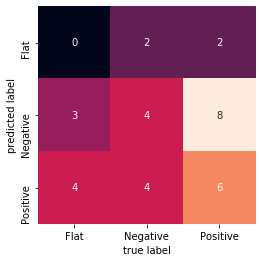

In [121]:
import seaborn as sns
mat = confusion_matrix(y_test, test_preds)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=['Flat', 'Negative','Positive'], yticklabels=['Flat', 'Negative','Positive'])
plt.xlabel('true label')
plt.ylabel('predicted label');

Plot Naive Byes Training Confusion Matrix

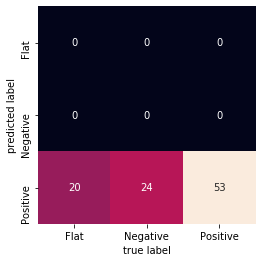

In [113]:
import seaborn as sns
mat = confusion_matrix(y_train, train_preds)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=['Flat', 'Negative','Positive'], yticklabels=['Flat', 'Negative','Positive'])
plt.xlabel('true label')
plt.ylabel('predicted label');

Create and fit Random Forest Model

In [106]:
from sklearn.ensemble import RandomForestClassifier
rf_classifier = RandomForestClassifier(n_estimators=250,min_samples_leaf=1, max_depth=7, class_weight='balanced')
rf_classifier.fit(tfidf_X_train,y_train)
rf_train_preds = rf_classifier.predict(tfidf_X_train)
rf_test_preds = rf_classifier.predict(tfidf_X_test)

Calculate Random Forest Training and Testing Accuracy Scores

In [107]:
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score
print(accuracy_score(y_train, rf_train_preds))
print(accuracy_score(y_test, rf_test_preds))

1.0
0.45454545454545453


Calculate Random Forest Training and Testing F1 Scores

In [110]:
print(f1_score(y_train, rf_train_preds,average='weighted'))
print(f1_score(y_test, rf_test_preds,average='weighted'))

1.0
0.3417452113104287


Calculate Random Foresting Testing Confusion Matrix

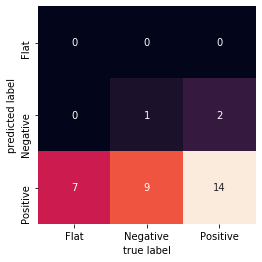

In [122]:
rf_mat = confusion_matrix(y_test, rf_test_preds)
sns.heatmap(rf_mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=['Flat', 'Negative','Positive'], yticklabels=['Flat', 'Negative','Positive'])
plt.xlabel('true label')
plt.ylabel('predicted label');

Calculate Random Foresting Training Confusion Matrix

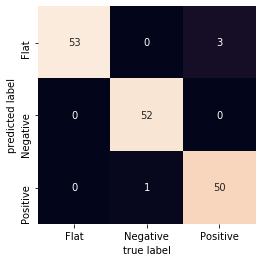

In [44]:
import seaborn as sns
mat = confusion_matrix(y_train, rf_train_preds)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=['Flat', 'Negative','Positive'], yticklabels=['Flat', 'Negative','Positive'])
plt.xlabel('true label')
plt.ylabel('predicted label');

Create Random Forest dictionary for GridSearchCV

In [46]:
from sklearn.model_selection import GridSearchCV
p={'max_depth': [1,10],
   'min_samples_leaf': range(1,15,1)}

Run GridSearchCV optimizing Random Forest model for F1 Score

In [71]:
rfc = RandomForestClassifier(random_state = 23,
                             n_estimators = 100,
                            class_weight='balanced')
grid_tree=GridSearchCV(rfc,p, cv=5, scoring='f1_weighted', verbose=1,n_jobs=-1)
grid_tree.fit(tfidf_X_train,y_train)

Fitting 5 folds for each of 196 candidates, totalling 980 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   22.1s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:   54.3s
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 980 out of 980 | elapsed:  2.6min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False, random_state=23,
                            

Print GridSearch Best Score

In [73]:
print(grid_tree.best_score_)

0.44453248505880083


Print GridSearch Best Params

In [74]:
print(grid_tree.best_params_)

{'max_depth': 2, 'min_samples_leaf': 1}


Calculate Gridsearch Random Forest X_train and X_test predictions

In [75]:
gt_train_preds = grid_tree.predict(tfidf_X_train)
gt_test_preds = grid_tree.predict(tfidf_X_test)

Calculate Gridsearch Random Forest Training and Testing Accuracy Scores

In [76]:
print(accuracy_score(y_train, gt_train_preds))
print(accuracy_score(y_test, gt_test_preds))

0.9278350515463918
0.45454545454545453


Calculate Gridsearch Random Forest Testing Confusion Matrix

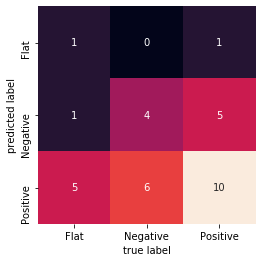

In [78]:
rf_mat = confusion_matrix(y_test, gt_test_preds)
sns.heatmap(rf_mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=['Flat', 'Negative','Positive'], yticklabels=['Flat', 'Negative','Positive'])
plt.xlabel('true label')
plt.ylabel('predicted label');

Calculate Gridsearch Random Forest Training and Testing F1 Scores

In [105]:
from sklearn.metrics import f1_score
print(f1_score(y_train, gt_train_preds,average='weighted'))
print(f1_score(y_test, gt_test_preds,average='weighted'))

0.9282387948451905
0.4304304304304304
